## Eksploracja danych pożarów lasów
W dokumencie tym zajmę się opisem dokonanej eksploracji danych dotyczących pożarów lasów
rejonów Portugalii. Pokażę kilka zależności pomiędzy zmiennymi zawartymi w ramce danych oraz sformułuję 
idące w analizy wnioski. Używane dane zawierają informację dotyczące newralgicznych zmiennych sprzyjających, bądź niesprzyjających występowaniu pożarów w rejonach leśnych.

Użyta ramka danych : [https://www.apispreadsheets.com/datasets/129](https://www.apispreadsheets.com/datasets/129)

In [2]:
# Przygotowanie bibliotek
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
from pandas_profiling import ProfileReport
# Wgranie ramek danych
df = pd.read_csv('forest_fires_dataset.csv')
DESCR = pd.read_csv('attributes_forest_fires.csv')

## Opis używanej ramki danych
Poniżej znajduje się opis kolumn oraz ich typ, które znajdują się w naszej ramce danych.
Z informacji źródłowych poadanych na stronie udostępniającej dane, wiemy, iż cała nasza ramka danych
nie zawiera ani wartości null, ani NaN. Co więcej wszystkie wartości są wypełnione poprawnie poprzez typ im
przypisany. Oznacza to iż nie ma potrzeby dokonywać "czyszczenia danych", zatem taki zabieg nie jest potrzebny, więc
został on pominięty w tym dokumencie. Nie zmienia to jednak faktu, iż dokonałem modyfikacji w ramce pod względem typów zmiennych. W dwóch przypadkach, gdzie dane były właśnie tego typu, postarałem się odzwierciedlić je w numerycznym typie.

In [13]:
print(DESCR)

     name     type                                        description
0       X  integer  x-axis spatial coordinate within the Montesinh...
1       Y  integer  y-axis spatial coordinate within the Montesinh...
2   month   string                  month of the year: 'jan' to 'dec'
3     day   string                    day of the week: 'mon' to 'sun'
4    FFMC    float      FFMC index from the FWI system: 18.7 to 96.20
5     DMC    float        DMC index from the FWI system: 1.1 to 291.3
6      DC    float         DC index from the FWI system: 7.9 to 860.6
7     ISI    float        ISI index from the FWI system: 0.0 to 56.10
8    temp    float       temperature in Celsius degrees: 2.2 to 33.30
9      RH    float                relative humidity in %: 15.0 to 100
10   wind    float                   wind speed in km/h: 0.40 to 9.40
11   rain    float                 outside rain in mm/m2 : 0.0 to 6.4
12   area    float  the burned area of the forest (in ha): 0.00 to...


Ramka prezentuje się w sposób następujący

In [26]:
print(df.head())
## Ilość wierszy oraz kolumn
print("\nIlość odpowiednio wierszy oraz kolumn wynosi:", df.shape)

   X  Y month  day  FFMC   DMC     DC  ISI  temp    RH  wind  rain  area
0  7  5   mar  fri  86.2  26.2   94.3  5.1   8.2  51.0   6.7   0.0   0.0
1  7  4   oct  tue  90.6  35.4  669.1  6.7  18.0  33.0   0.9   0.0   0.0
2  7  4   oct  sat  90.6  43.7  686.9  6.7  14.6  33.0   1.3   0.0   0.0
3  8  6   mar  fri  91.7  33.3   77.5  9.0   8.3  97.0   4.0   0.2   0.0
4  8  6   mar  sun  89.3  51.3  102.2  9.6  11.4  99.0   1.8   0.0   0.0

Ilość odpowiednio wierszy oraz kolumn wynosi: (517, 13)


Zobaczmy, czy naprawdę nie brakuje żadnych wartości, jak upewnili nas autorzy ramki.

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 517 entries, 0 to 516
Data columns (total 13 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   X       517 non-null    int64  
 1   Y       517 non-null    int64  
 2   month   517 non-null    object 
 3   day     517 non-null    object 
 4   FFMC    517 non-null    float64
 5   DMC     517 non-null    float64
 6   DC      517 non-null    float64
 7   ISI     517 non-null    float64
 8   temp    517 non-null    float64
 9   RH      517 non-null    float64
 10  wind    517 non-null    float64
 11  rain    517 non-null    float64
 12  area    517 non-null    float64
dtypes: float64(9), int64(2), object(2)
memory usage: 52.6+ KB


Nie zostaliśmy okłamani.

### Statystyki ogólne oraz wstępna wizualizacja
Przyjżyjmy się najpierw podstawowym statystykom poszczególnych zmiennych. Ponieważ większość z nich (11 z 13) jest
typu float, otrzymamy otrzymaną tabele danych za pomocą instancji ".describe()"

In [28]:
print(df.describe())

                X           Y        FFMC         DMC          DC         ISI  \
count  517.000000  517.000000  517.000000  517.000000  517.000000  517.000000   
mean     4.669246    4.299807   90.644681  110.872340  547.940039    9.021663   
std      2.313778    1.229900    5.520111   64.046482  248.066192    4.559477   
min      1.000000    2.000000   18.700000    1.100000    7.900000    0.000000   
25%      3.000000    4.000000   90.200000   68.600000  437.700000    6.500000   
50%      4.000000    4.000000   91.600000  108.300000  664.200000    8.400000   
75%      7.000000    5.000000   92.900000  142.400000  713.900000   10.800000   
max      9.000000    9.000000   96.200000  291.300000  860.600000   56.100000   

             temp          RH        wind        rain         area  
count  517.000000  517.000000  517.000000  517.000000   517.000000  
mean    18.889168   44.288201    4.017602    0.021663    12.847292  
std      5.806625   16.317469    1.791653    0.295959    63.655

Najbardziej "interesujące" powinny wydawać się nam te zmienne, które są najbardziej opisywalne, tudzież takie, których odchylenie standardowe jest dość niewielkie. W ogólności odchylenie standardowe jest dość niewielkie dla większości danych, lecz dla np. DMC, DC ich wartości są wyjątkowo spore (szczgólnie dla DM).

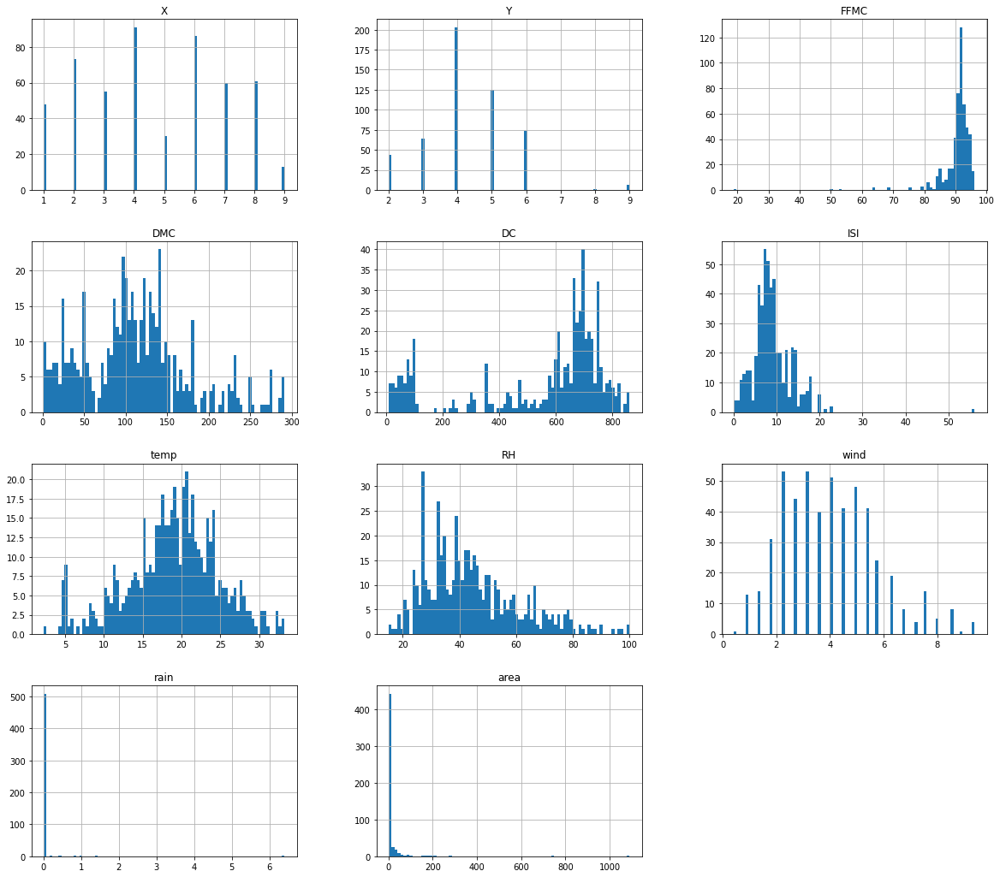

In [36]:
#Wizualizacja powyższych wyników w postaci histogramów
df.hist(bins = 80,figsize = (20,18))
plt.show()

### Wnioski z rozkładów
Jak widzimy rozkład zmiennych temperatury, watru, ISI, oraz współczynnikowi RH są dośc podobne do rozkładu normalnego, co jest dużym indykatorem, iż zmienne te będą dość użyteczne w naszej analizie zależności danych zmiennych.

W przypadku innych zmiennych dystrybucje są inne, lecz to nie zawsze implikuje negatywność takiej cechy. Zmienne dla deszczu oraz pola powierzchni są niemal scentrowane na jednej wartości, co mówi nam jednoznacznie o warunkach sprzyjających występowania pożarów.

Dla zmiennej DMC, dane są bardziej rozproszone, lecz formują pewien dość spłaszczony wykres rozkładu normalnego, będzie ciężej z ekstrakcją wniosków z tej zmiennej, lecz na pewno pomoże ona nam przy analizie.

Dla współrzędnych, ich wartości nie są zbyt zróżnicowane oraz są dość stale rozdzielone (przynajmniej dla zmiennej X), więc raczej dla uproszczenia analizy uznam iż nie wniosą wystarczająco dużo informacji do niej.

### Parirplot
Zobaczę na początku jak graficznie zmienne mają się do siebie, czy są jakieś interesujące zależności, które na "oko" można uznać za wystarczające do stwierdzenia jakiś zależności między zmiennymi. Ich graficzna reprezentacja będzie użyteczna dla wybierania przez jednostkę ludzką ciekawych zależności, a przy okazji wygląda dość estetycznie.

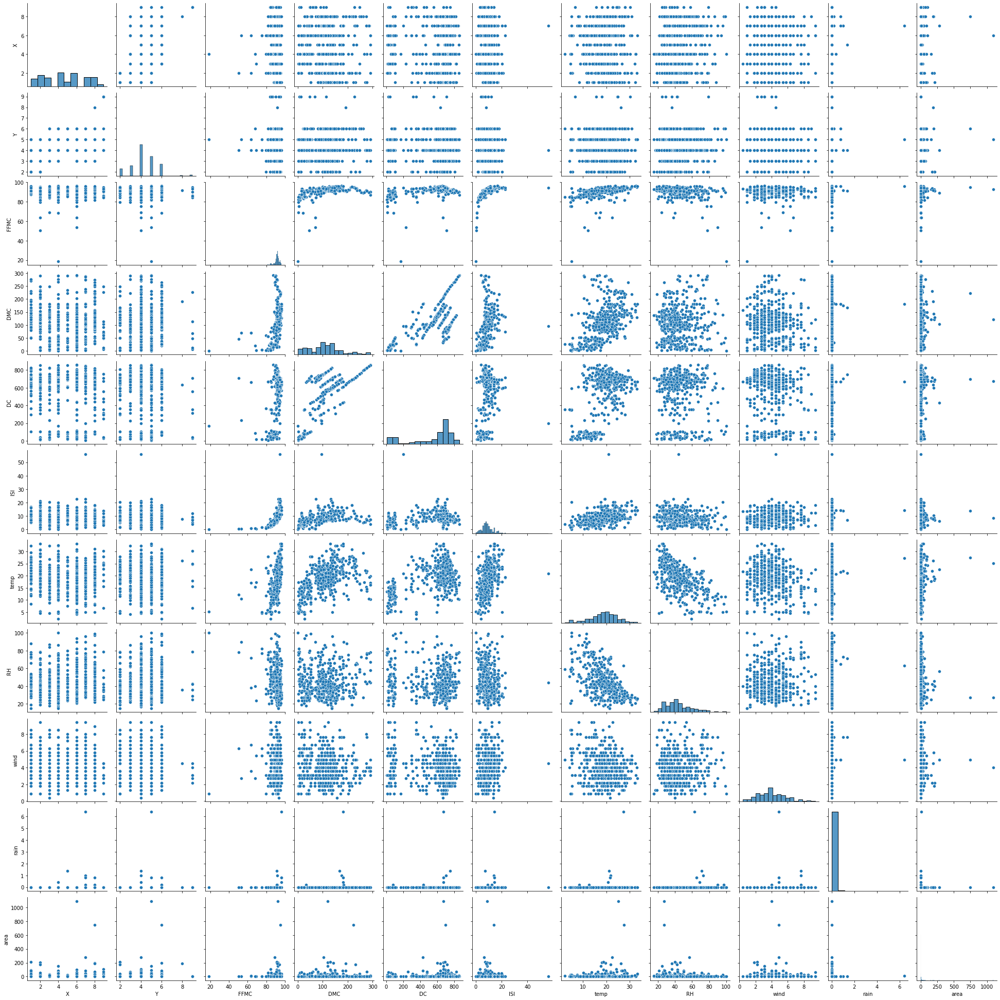

In [38]:
sns.pairplot(df)

### Dokładniejsze spojrzenie
Teraz zerknijmy dokładniej na poszczególne wykresy korelacji, lecz tylko na te ukazujące pewne zależności. Postaram się wnieść odpowiedzieć logikę stojącą za tą relacją, oraz wnieść kilka słów mojej opinii. 

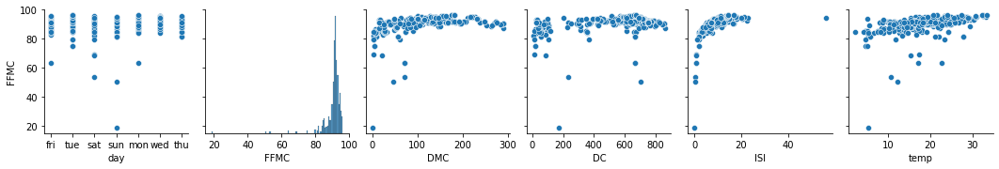

In [3]:
sns.pairplot(df, y_vars="FFMC", x_vars=df.columns.values[3:9])

Indeks FFMC jest powiązany pewną "lekką krzywą" z zmiennymi DMC, DC, ISI. W przypadku temperatury zaobserwować da się już liniową zależność. Więc ostatecznie najwięcej informacji otrzymamy z zależności temperatury oraz FFMC.

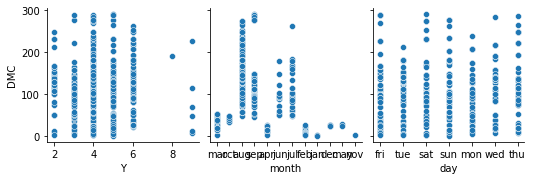

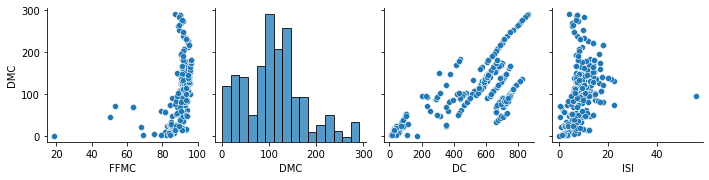

In [7]:
sns.pairplot(df, y_vars="DMC", x_vars=df.columns.values[1:4])
sns.pairplot(df, y_vars="DMC", x_vars=df.columns.values[4:8])

Ponieważ jak już wiemy dystrybucja współczynnika DMC nie była idealnym rozkładem normalnym, to jego realacje z niektórymi zmiennymi nie jest aż tak klarowna, lecz jak widzimy z powyższych wykresów istnieje. W szcególnyści widać kilka grup w zależności DMC orac DC, które satysfakcjonują zależność liniową. Jest to idealna zależność gdyż nie tylko dowiadujemy się o ich liniowości, ale również o potencjalnej analizie ze względu na grupy i znalezieniu jej, idealne zadanie dla machine-learningu.

Przy zależności FFMC oraz ISI, obserwujemy zbieżność zleżności do pewnej wartości i ich scentrowanie, co prawdopodobnie nie dałoby nam precyzyjnej zależności.

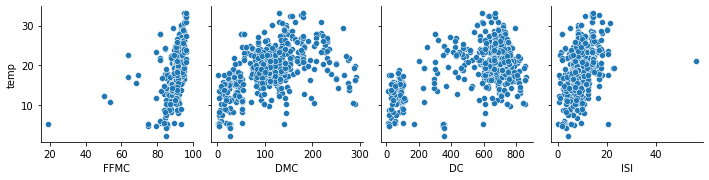

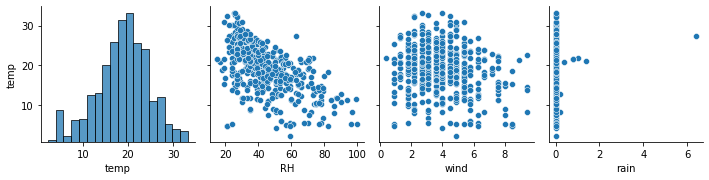

In [11]:
sns.pairplot(df, y_vars="temp", x_vars=df.columns.values[4:8])
sns.pairplot(df, y_vars="temp", x_vars=df.columns.values[8:12])

W przypadku przyjżenia się bliżej zmiennej temperatury, jej najbardziej klarowną zależnością jest ta z współczynnikiem RH. Reszta wydaje się mieć niezbyt duży współczynnik korelacji. Jednak, dla przykładu, wykres dla temperatury oraz DC oraz (w mniejszym stopniu lecz nadal) dla temperatury oraz DMC, wskazuje nam pewne dwie potencjalne grupy, gdyż wartości układają się do dwóch zbiorów. 

<AxesSubplot:xlabel='month', ylabel='count'>

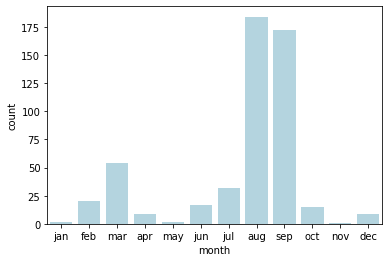

In [18]:
sns.countplot(x="month", data=df, color ="lightblue",order=["jan","feb","mar","apr","may","jun","jul","aug","sep","oct","nov","dec"])

Patrząc na wyniki poprzednie można było zobaczyć na pewne dysproporcje w rozkładzie miesięcy, a więc dokonałem ich przeliczenia (raport ich uwzględnił przez ich typ danych kategorycznych, a nie numerycznych). Widać klarownie, iż sierpień i wrzesień są miesiącami "pożarowymi".

### Wykorzystanie tabeli korelacji
Jeżeli dysponujemy liczną ilością zmiennych to wygodnym rozwiązaniem może być użycie tabeli korelacji by znaleść analitycznie zależności, a następnie przedstawić je graficznie.

Jak widzimy, wcześniej omawiane przeze mnie wartości mają dość znaczące wartości korelacji (przynajmniej większe niż 0.2), od razu widzimy, które zmienne można od razu odrzucić z naszej analizy.

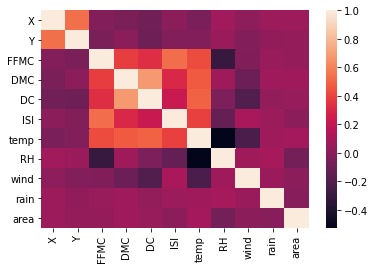

In [12]:
Korelacja = df.drop(columns = ["month","day"])
Korelacja = Korelacja.corr()
sns.heatmap(Korelacja,annot = False)
plt.show()

## Użyjmy teraz narzędzia raportowego 

In [7]:
# Przygotowanie raportu z pakietu pandas_profiling
ProfileReport(df,title = "Raport")

Summarize dataset:   0%|          | 0/26 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Kilka słów o użytym narzędziu

Narzędzie jest z cała pewnością niezwykle wygodne do szybkiego przygotowania szybkiej i dość obszernej analizy dotyczącego danego zagadnienia. Raport zaspokoił najbardziej główne zapytania oraz informacje, dotyczące naszych danych. Narzędzie oszczędziłoby nam dużą ilość czasu, lecz nie jest również idealne.

Wedle mojej opinii, analiza dokonana przez program jest jak najbardziej obszerna, czasami (przez jej schematyczność) prezentuje niepotrzebne zależności, lub całkowity ich brak. Niektóre części analizy są po prostu redundantne, i choć wychodzę z założenia iż przedstawienie większej ilości (nawet mało istotnych danych) jest lepsze niż podjęcie ryzyka pominięcia ważnej zależności, to program mogłby uwzględniać "zwięzły" raport, uwzględniający, wedle kryterium, tylko istotne wyniki.

Co więcej powyższa analiza jest jak najbardziej pomocna, lecz nie modyfikuje zbytnio ramki danych, na której operujemy. Przyjmuje otrzymane dane i wykonuje swoją pracę, nie dokonując na przykład zamiany danych kategorycznych na numeracyjne, bądź wypełnienie wartości NULL, bądź "NaN", wedle matematycznego wzorca postępowania. Również nie dokonuje "modyfikacji" na ramce danych (nie dzieli ich, nie usuwa wartości skrajnych, nie dokonuje dogłębszej analizy), zatem jest dość powierzchowna. Najlepiej narzędzia użyć na już spreparowanej ramce danych.